# import

In [1]:
import diffusers
import torch
import transformers
from PIL import Image
from diffusers import UNet2DConditionModel

# sdxl

In [ ]:
pipe = diffusers.StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True,
).to("cuda")

In [ ]:
pipe.save_pretrained(
    "/home/aihao/workspace/DeepLearningContent/models/sdxl_itjcp/sdxl-base"
)

In [ ]:
pipe = diffusers.StableDiffusionXLPipeline.from_pretrained(
    "/home/aihao/workspace/DeepLearningContent/models/sdxl_itjcp/sdxl-base",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True,
).to("cuda")

In [ ]:
pipe.unet.config

In [ ]:
pipe.text_encoder

In [ ]:
pipe.text_encoder_2

# CLIP

In [7]:
clip = transformers.CLIPModel.from_pretrained(
    "/home/aihao/workspace/DeepLearningContent/models/clip/CLIP-ViT-bigG-14-laion2B-39B-b160k",
    torch_dtype=torch.float16,
).to("cuda")

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["projection_dim"]` will be overriden.
`vision_config_dict` is provided which will be used to initialize `CLIPVisionConfig`. The value `vision_config["projection_dim"]` will be overriden.


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

## image encoder

In [2]:
image_precessor = transformers.CLIPImageProcessor.from_pretrained(
    "laion/CLIP-ViT-bigG-14-laion2B-39B-b160k", torch_dtype=torch.float16
)

In [3]:
image_path = "/home/aihao/workspace/DeepLearningContent/datasets/images/data/pixiv/Indol/Illustration/_Indol - pixiv__Illustration_Ayaka Kamisato,Kamisato Ayaka (Genshin Impact),Genshin Impact,GenshinImpact,Genshin,girl,Springbloom Missive_106373881_p000.jpg"

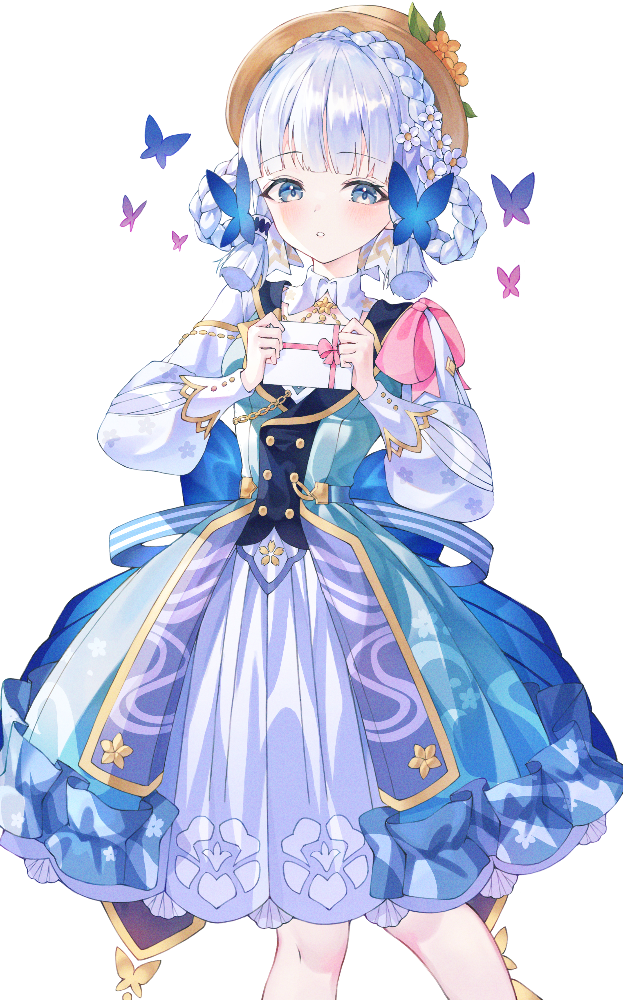

In [4]:
image = Image.open(image_path)
image

In [5]:
pixel_values = image_precessor(image, return_tensors="pt").pixel_values.to("cuda",dtype=torch.float16)
pixel_values

tensor([[[[1.9307, 1.9307, 1.9307,  ..., 1.9307, 1.9307, 1.9307],
          [1.9307, 1.9307, 1.9307,  ..., 1.9307, 1.9307, 1.9307],
          [1.9307, 1.9307, 1.9307,  ..., 1.9307, 1.9307, 1.9307],
          ...,
          [1.4053, 1.2441, 1.2588,  ..., 0.8501, 1.9014, 1.9307],
          [1.3906, 1.2588, 1.2588,  ..., 1.8428, 1.9307, 1.9307],
          [1.3906, 1.2588, 1.2588,  ..., 1.9307, 1.9307, 1.9307]],

         [[2.0742, 2.0742, 2.0742,  ..., 2.0742, 2.0742, 2.0742],
          [2.0742, 2.0742, 2.0742,  ..., 2.0742, 2.0742, 2.0742],
          [2.0742, 2.0742, 2.0742,  ..., 2.0742, 2.0742, 2.0742],
          ...,
          [1.6699, 1.5498, 1.5645,  ..., 1.1748, 2.0449, 2.0742],
          [1.6699, 1.5342, 1.5498,  ..., 1.9844, 2.0742, 2.0742],
          [1.6699, 1.5498, 1.5645,  ..., 2.0742, 2.0742, 2.0742]],

         [[2.1465, 2.1465, 2.1465,  ..., 2.1465, 2.1465, 2.1465],
          [2.1465, 2.1465, 2.1465,  ..., 2.1465, 2.1465, 2.1465],
          [2.1465, 2.1465, 2.1465,  ..., 2

In [8]:
clip.vision_model(pixel_values, output_hidden_states=True).last_hidden_state.shape

/home/aihao/miniconda3/envs/torch/lib/python3.11/site-packages/torch/nn/modules/conv.py:459: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1682343995622/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,


torch.Size([1, 257, 1664])

In [ ]:
clip.config

## CLIPVisionModelWithProjection

In [6]:
image_encoder=transformers.CLIPVisionModelWithProjection.from_pretrained("/home/aihao/workspace/DeepLearningContent/models/clip/CLIP-ViT-bigG-14-laion2B-39B-b160k").to("cuda",dtype=torch.float16)
image_encoder

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

CLIPVisionModelWithProjection(
  (vision_model): CLIPVisionTransformer(
    (embeddings): CLIPVisionEmbeddings(
      (patch_embedding): Conv2d(3, 1664, kernel_size=(14, 14), stride=(14, 14), bias=False)
      (position_embedding): Embedding(257, 1664)
    )
    (pre_layrnorm): LayerNorm((1664,), eps=1e-05, elementwise_affine=True)
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-47): 48 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=1664, out_features=1664, bias=True)
            (v_proj): Linear(in_features=1664, out_features=1664, bias=True)
            (q_proj): Linear(in_features=1664, out_features=1664, bias=True)
            (out_proj): Linear(in_features=1664, out_features=1664, bias=True)
          )
          (layer_norm1): LayerNorm((1664,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=1664, out_features=81

In [9]:
pixel_values.shape

torch.Size([1, 3, 224, 224])

In [11]:
inputs=pixel_values.repeat(2,1,1,1)

In [12]:
inputs.shape

torch.Size([2, 3, 224, 224])

In [13]:
image_encoder(inputs, output_hidden_states=True).image_embeds.shape

torch.Size([2, 1280])

In [ ]:
clip.config

## tokenizer

In [14]:
tokenizer = transformers.CLIPTokenizer.from_pretrained(
    "/home/aihao/workspace/DeepLearningContent/models/clip/CLIP-ViT-bigG-14-laion2B-39B-b160k"
)

In [17]:
input_ids = tokenizer(
    ["1girl","adad"],
    padding="longest",
    truncation=True,
    return_tensors="pt",
).input_ids.to("cuda")
input_ids.shape

torch.Size([2, 4])

In [18]:
input_ids = tokenizer(
    ["1girl","adad"],
    padding="max_length",
    max_length=77,
    truncation=True,
    return_tensors="pt",
).input_ids.to("cuda")
input_ids.shape

torch.Size([2, 77])

In [21]:
input_ids

tensor([[49406,   272,  1611, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]], device='cuda:0')

## text_encoder

In [16]:
text_encoder = transformers.CLIPTextModelWithProjection.from_pretrained(
    "/home/aihao/workspace/DeepLearningContent/models/clip/CLIP-ViT-bigG-14-laion2B-39B-b160k"
).to("cuda")

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [19]:
text_embds = text_encoder(input_ids, output_hidden_states=True)

In [21]:
text_embds.hidden_states[-2].shape

torch.Size([2, 77, 1280])

In [22]:
text_embds.hidden_states[-2].shape

torch.Size([1, 77, 1280])

# test image text joint control pooled only